In [12]:
import base64
import glob
import io
from IPython.display import display, HTML

import gymnasium as gym
import numpy as np
import pickle

from matplotlib import pyplot as plt
from ribs.visualize import grid_archive_heatmap

In [13]:
def evaluate(env, model):
    total_reward = 0.0
    
    obs, done = env.reset(), False
    obs = obs[0]

    action_dim = env.action_space.shape[0]
    obs_dim = env.observation_space.shape[0]
    reshaped_model = model.reshape(action_dim, obs_dim)

    while not done:
        action = np.clip(reshaped_model @ obs, -1, 1)

        obs, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        total_reward += reward

In [14]:
video_env = gym.wrappers.RecordVideo(
        gym.make("HalfCheetah-v5", render_mode='rgb_array'),
        video_folder="videos",
        episode_trigger=lambda idx: True,
        disable_logger=True
)

/home/bryce/anaconda3/envs/qd-mujoco/lib/python3.11/site-packages/gymnasium/wrappers/rendering.py:283: UserWarning: WARN: Overwriting existing videos at /home/bryce/Repos/mujoco-map-elites/videos folder (try specifying a different `video_folder` for the `RecordVideo` wrapper if this is not desired)
  logger.warn(


In [15]:
with open('models/HalfCheetah-v5-6000.pkl', 'rb') as f:
    archive = pickle.load(f)

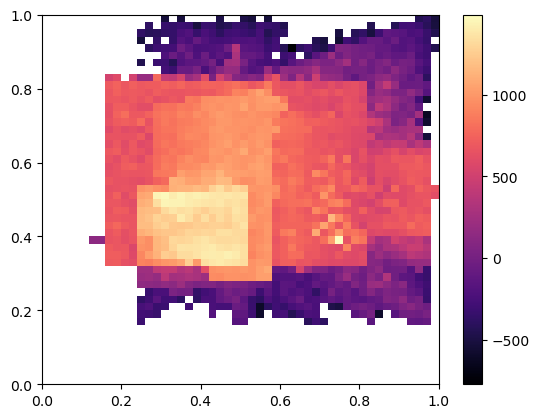

In [16]:
grid_archive_heatmap(archive)
plt.show()

In [17]:
df = archive.data(return_type="pandas")
high_perf_sols = df.query("objective > 1200").sort_values("objective", ascending=False)

i = 0
for elite in high_perf_sols.iterelites():
    evaluate(video_env, elite['solution'])
    print(f"Elite {i} has the measures: {elite['measures']}")
    i += 1
    
    if i > 5:
        break

Elite 0 has the measures: [0.747 0.381]
Elite 1 has the measures: [0.304 0.5  ]
Elite 2 has the measures: [0.296 0.503]
Elite 3 has the measures: [0.354 0.507]
Elite 4 has the measures: [0.311 0.487]
Elite 5 has the measures: [0.324 0.496]


In [20]:
for video_file in glob.glob("videos/*.mp4"):
    video = io.open(video_file, 'rb').read()
    encoded = base64.b64encode(video).decode("ascii")
    display(
        HTML(f'''
            <video width="360" height="auto" controls>
                <source src="data:video/mp4;base64;{encoded}" type="video/mp4"
            </video>
        ''')
    )